<a href="https://colab.research.google.com/github/Zoro-chi/Dog-Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#🦮🐩🐕‍🦺 Multi-class Dog Breed Classification  

This notebook builds an end to end multi-class image classifier using TensorFlow2.0 and TensorFlow Hub.

## 1. Problem
  Identifying the **`breed`** of a dog given an image of a dog.


## 2. Data
  Data being used is from Kaggle's Dog Breed Identification data-set.
  
  https://www.kaggle.com/competitions/dog-breed-identification/data


## 3. Evaluation
  The evaluation is a file with prediction probabilities for each dog breed of each test image.

  www.kaggle.com/competitions/dog-breed-identification/overview/evaluation
  

## 4. Features
  Some info about the data:
  * We're dealing with images (unstructured data) so its best to use deep learning/transfer learning.
  * There are 120 breeds of dogs (this means there are 120 different target classes).
  * There are around 10,000+ images in the training set (these images have labels).
  * There are around 10,000+ images in the test set (these images have no labels because we have to predict them).

In [2]:
# Unzipping data from google drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

### Get workspace ready
* Import Tensorflow 2.x.x
* Import Tensorflow Hub
* Make sure to use a GPU

In [3]:

# Import neccessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
from keras.config import enable_unsafe_deserialization

# Enable unsafe deserialization
enable_unsafe_deserialization()

print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availablility
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")
print("GPU:", tf.test.gpu_device_name())


TF version: 2.17.1
TF Hub version: 0.16.1
GPU available
GPU: /device:GPU:0


## Getting the data ready (turning into tensors)

With all machine learning models, our data has to be in numerical format.
We'll be turning images into Tensors (numeric representations).

Checking data and accessing labels.

In [4]:
# Check out labels of data
import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


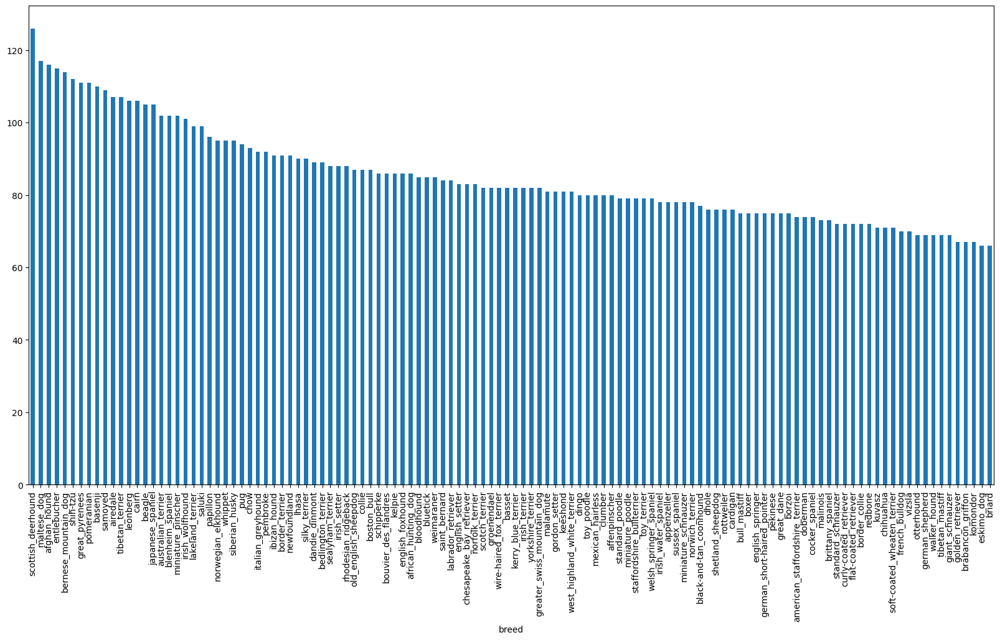

In [5]:
# How many images are there of each breed

labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [6]:
labels_csv["breed"].value_counts().median()

82.0

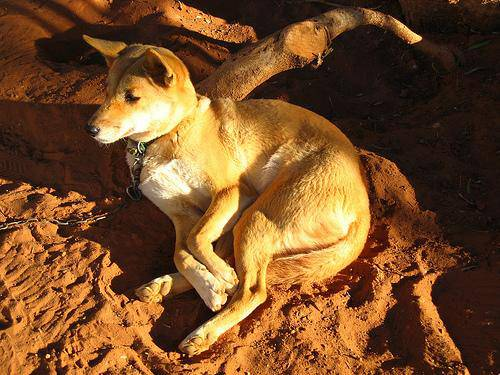

In [7]:
# View an image
from IPython.display import Image

Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ID's

filepaths = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filepaths[:20]


['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [10]:
# Check whether number of filenames match number of actual images
import os

if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filepaths):
    print("Filenames match actual amount of files!")
else:
    print("Filenames do not match actual amount of files, check data!")

Filenames match actual amount of files!


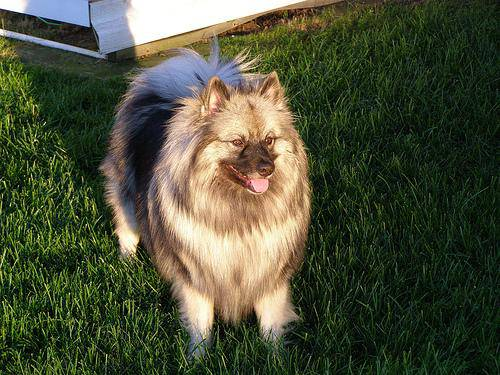

In [11]:
# One more check
Image(filepaths[4500])

In [12]:
labels_csv["breed"][4500]

'keeshond'

### Since we've got the training image filepaths in a list, lets prepare our labels.

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# See if number of labels matches number of filenames
if len(labels) == len(filepaths):
    print("Number of labels matches number of filenames!")
else:
    print("Number of labels does not match number of filenames, check data!")

Number of labels matches number of filenames!


In [16]:
# Find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [17]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
# Example: Turning boolean array into integers
print(labels[0])  # Original label
print(np.where(unique_breeds == labels[0])[0][0])  # Index where label occurs
print(boolean_labels[0].argmax())  # Index where label occurs in boolean array
print(boolean_labels[0].astype(int))  # There will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the data from Kaggle doesn't come with a validation set, we're going to create our own.

In [20]:
# Setup x and y variables
X = filepaths
y = boolean_labels

We're going to start of with ~1000 images and increase them as needed. Training 10000+ images would take some time

In [21]:
# Set number of images we could use for experimenting
NUM_IMAGES = 1000   # @param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [22]:
# Lets split our data into test and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [23]:
# Verifying test and validation data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (Turning Images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image` to be a shape of (224, 224).
5. Return the modified image.

Before we do lets see what importing an image looks like.

In [24]:
# Convert image to numpy array
from matplotlib.pyplot import imread

image = imread(filepaths[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
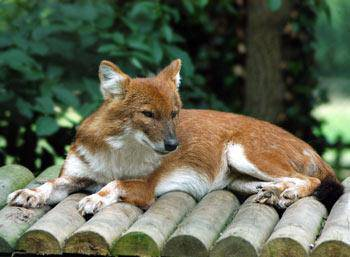

In [25]:
image

In [26]:
# Turning image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

### Now we've seen what an image looks like as a tensor, lets make a function to preprocess them.

1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our `image` (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified image.

In [27]:
# Define image size
IMG_SIZE = 224

# Create function for preprocessing images:
def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns it into a Tensor.
    """
    # Read in an image file
    image = tf.io.read_file(image_path)
    # Turn the jpeg image into numerical Tensors with 3 color channels (Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels=3)
    # Convert the color channel values from 0-225 to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize the image to our desired size (244, 244)
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image




In [28]:
tf.image.convert_image_dtype(image, tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34901962, 0.5372549 , 0.34901962],
        [0.29803923, 0.48627454, 0.29803923],
        [0.24705884, 0.43529415, 0.2392157 ],
        ...,
        [0.3019608 , 0.52156866, 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ]],

       [[0.28235295, 0.4666667 , 0.29411766],
        [0.2627451 , 0.44705886, 0.26666668],
        [0.24705884, 0.43137258, 0.2509804 ],
        ...,
        [0.29411766, 0.5137255 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21960786, 0.40784317, 0.25882354],
        [0.227451  , 0.4156863 , 0.26666668],
        [0.2509804 , 0.43921572, 0.2901961 ],
        ...,
        [0.2784314 , 0.49803925, 0.32156864],
        [0.28627452, 0.5058824 , 0.32941177],
        [0.2901961 , 0.50980395, 0.33333334]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

## Turning our data into batches

Why turn our data into batches?

Lets say you're trying to process 10,000+ images in one go, they all might not fit into memory.

Thats why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if needs be).

In order to use Tensorflow effectively, we need our data in the form of tensor tuples, which look like this: `(image, label)`

In [29]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
    """"
    Takes an image file path name and the associated label,
    processes the image and returns a tuple of (image, label).
    """
    image = process_image(image_path)
    return image, label


In [30]:
# Demo of the above
get_image_label(X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all of our data (`X` & `y`) into batches

In [31]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably dont have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we dont need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it.
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [32]:
# Create training and validation datasets
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [33]:
# Checkout the different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

The data is now in batches, but it could be pretty hard to understand.
Let's visualize the data.

In [34]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create sub-plots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [35]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [36]:

# len(train_images), len(train_labels)

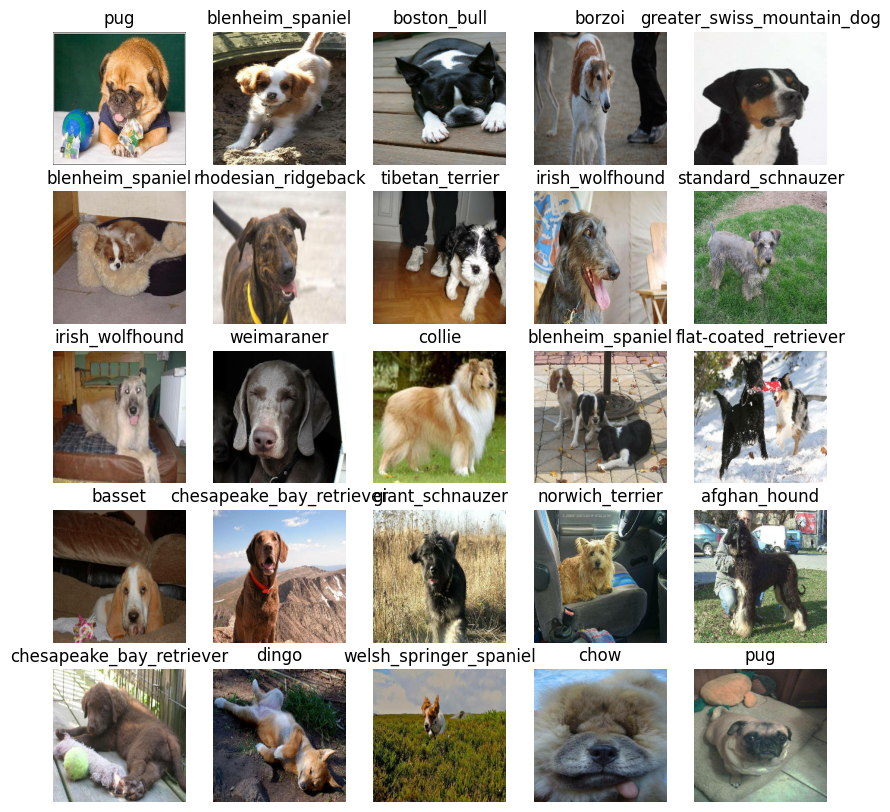

In [37]:
# Now to visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

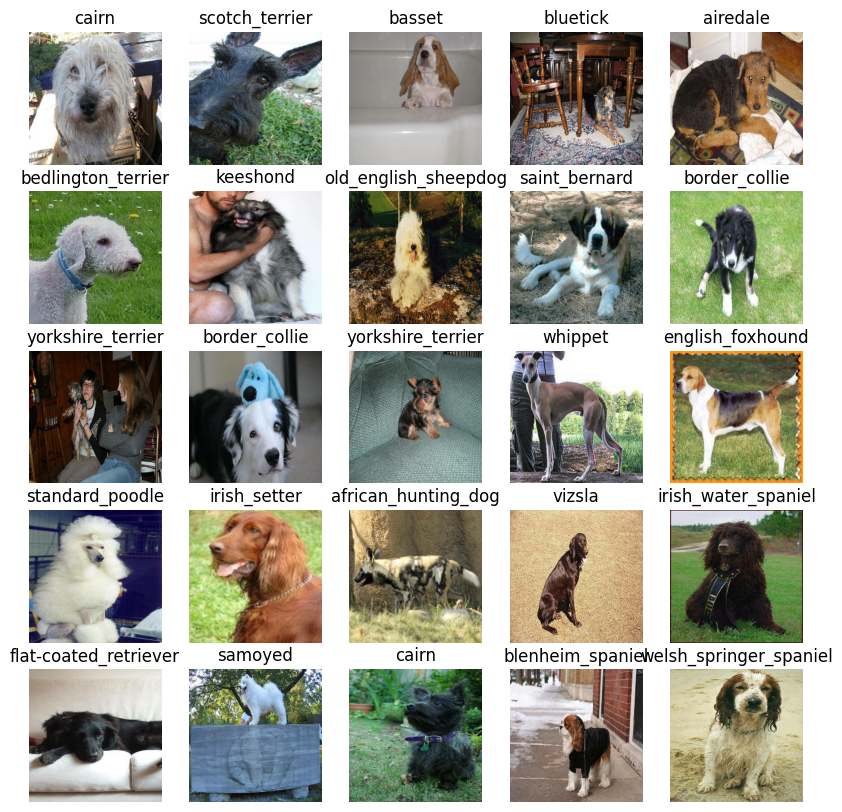

In [38]:
# Now to visualize the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before building a model, there are a few things that need to be defined:
* The input shape (image shape in the form of Tensors) to the model.
* The output shape (image labels, in the form of Tensors) of the model.
* The URL of the model being used from TensorFlow Hub - https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1

In [39]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL fro TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now the inputs, outputs and model is ready, lets put them together into a keras deep learning model.

Knowing this, lets create a function which:
* Takes the input shape, output shape and the model chosen as parameters.
* Defines the layers in a keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of the steps can be found here: https://www.tensorflow.org/guide/keras

In [40]:
# Adding a custom wrapper layer

# @tf.keras.utils.register_keras_serializable(package="Custom", name="HubLayerWrapper")
# class HubLayerWrapper(tf.keras.layers.Layer):
#     def __init__(self, model_url, input_shape=None, trainable=False, **kwargs):
#         super(HubLayerWrapper, self).__init__(**kwargs)
#         self.model_url = model_url
#         self.input_shape_arg = input_shape  # Avoid conflict with Layer's input_shape
#         self.trainable = trainable
#         # Delay the creation of hub_layer until build time
#         self.hub_layer = None

#     def build(self, input_shape):
#     # Ensure input_shape_arg matches what the hub model expects
#       if self.input_shape_arg is None:
#         self.input_shape_arg = (224, 224, 3)  # Default to the expected shape

#     # Initialize the hub layer with the correct input shape
#       self.hub_layer = hub.KerasLayer(
#         self.model_url,
#         input_shape=self.input_shape_arg,
#         trainable=self.trainable
#       )
#       super(HubLayerWrapper, self).build(input_shape)

#     def call(self, inputs):
#         return self.hub_layer(inputs)

#     def get_config(self):
#         config = super(HubLayerWrapper, self).get_config()
#         config.update({
#             'model_url': self.model_url,
#             'input_shape': self.input_shape_arg,
#             'trainable': self.trainable,
#         })
#         return config

#     def compute_output_shape(self, input_shape):
#       return self.hub_layer.compute_output_shape(input_shape)

##     @classmethod
#     def from_config(cls, config):
#         return cls(**config)

In [41]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", MODEL_URL)

    # Load the TensorFlow Hub layer
    hubs_layer = hub.KerasLayer(MODEL_URL)

    # Setup the model layers
    model = tf.keras.Sequential([
        # Wrapping hub.KerasLayer in a Lambda to ensure compatibility with Sequential
        tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (Input Layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")  # Layer 2 (Output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model
    model.build(INPUT_SHAPE)

    return model

# # UPDATED FIX WITH THE WRAPPER ABOVE
# # Define our model now
# def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
#     print("Building model with:", model_url)

#     # Wrap the hub_layer in the custom layer
#     wrapped_hub_layer = HubLayerWrapper(model_url=model_url, input_shape=input_shape, trainable=False)

#     # Build the model
#     model = tf.keras.Sequential([
#         tf.keras.Input(shape=input_shape),
#         wrapped_hub_layer,
#         tf.keras.layers.Dense(units=output_shape, activation="softmax")
#     ])

#     # Compile the model
#     model.compile(
#         loss=tf.keras.losses.CategoricalCrossentropy(),
#         optimizer=tf.keras.optimizers.Adam(),
#         metrics=["accuracy"]
#     )

#     return model


In [42]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving and more!

Creating 2 callbacks:
* One for TensorBoard which helps track the model's progress.
* Another for early stopping which prevents the model from learning for too long.

### TensorBoard Callback

To setup TensorBoard callback, 3 things are needed:
1. Load TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` function.
3. Visualize model's training logs with the `%tensoboard` magic function (This is after model training)

In [43]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [44]:
import datetime

# Create function to build a TensorBoard callback
def create_tensorboard_callback():
    # Create a log directory for storing TensorBoard logs
    logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                          # Make it so the logs get tracked whenever an experiment runs
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [45]:
# Create Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Training a model (on a subset of data)

The first model is only going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCHS = 100   # @param {type:"slider", min:10, max:100, step:10}
NUM_EPOCHS

100

In [47]:
# Check to make sure GPU is still running
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")
print("GPU:", tf.test.gpu_device_name())

GPU available
GPU: /device:GPU:0


Creating a function which trains a model.

* Create model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on the model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [48]:
# Build a function to train and return a trained model
def train_model():
    """
    Trains a given model and returns the trained version.
    """
    # Create a model
    model = create_model()

    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

    # Return the fitted model
    return model

In [49]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 182s 6s/step - accuracy: 0.0450 - loss: 5.0709 - val_accuracy: 0.2800 - val_loss: 3.5643
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 29s 227ms/step - accuracy: 0.6746 - loss: 1.8744 - val_accuracy: 0.4900 - val_loss: 2.2208
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 167ms/step - accuracy: 0.9407 - loss: 0.6229 - val_accuracy: 0.5900 - val_loss: 1.7270
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.9858 - loss: 0.2719 - val_accuracy: 0.6350 - val_loss: 1.5104
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 171ms/step - accuracy: 0.9946 - loss: 0.1472 - val_accuracy: 0.6500 - val_loss: 1.4248
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 1.0000 - loss: 0.0999 - val_accuracy: 0.6650 - val_loss: 1.3843
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - accuracy: 1.0000 - loss: 0.0781 - val_accuracy: 0.6700 - val_loss:

Model above is overfitting as the training accuracy is a lot higher than the validation accuracy.

Also early_stopping is working as the model didnt get to a 100 EPOCHs and stopped after no improvement.

**Note:** Overfitting to begin is a good thing because it means the model is learning!!

### Checking the TensorBoard logs

The TensorBoard magic function `(%tensorboard)` will access the log directory created earlier and visualize its contents

In [50]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model.

In [51]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 417ms/step


array([[7.35393667e-04, 2.33418832e-05, 1.18162192e-03, ...,
        3.91691465e-05, 5.05526714e-06, 9.56222473e-04],
       [8.24460352e-04, 1.77436697e-04, 3.48864868e-03, ...,
        1.21946330e-03, 1.12863153e-03, 1.25424558e-04],
       [1.04219071e-05, 2.29121442e-03, 6.37296253e-05, ...,
        1.04523795e-04, 4.71625135e-05, 2.46821146e-04],
       ...,
       [1.67952458e-05, 1.49404310e-04, 5.43243041e-05, ...,
        1.98639565e-04, 3.92193906e-04, 2.48461110e-05],
       [4.02969681e-03, 4.10694425e-04, 4.09306725e-04, ...,
        2.41674134e-04, 1.51047279e-04, 3.34362611e-02],
       [4.18341406e-05, 3.64176085e-05, 1.11532712e-03, ...,
        2.96133501e-03, 2.18928239e-04, 2.77671097e-05]], dtype=float32)

In [52]:
predictions.shape
# 200 Images with each image having a corresponding value to each of the 120 labels / dog breeds.

(200, 120)

In [53]:
predictions[0]
# The highest number is what breed the model thinks the image is.

array([7.35393667e-04, 2.33418832e-05, 1.18162192e-03, 4.91562023e-05,
       1.17772826e-04, 9.19570884e-05, 1.04544936e-02, 5.68279007e-04,
       1.48381281e-04, 4.69824299e-04, 1.53127185e-04, 4.36660557e-05,
       8.16922839e-05, 1.92562729e-05, 1.76114714e-04, 2.53667007e-04,
       5.55912629e-05, 1.13743477e-01, 1.75528094e-05, 4.37096351e-05,
       4.83473326e-04, 4.96641405e-06, 1.12952685e-05, 7.96855136e-04,
       3.35326149e-05, 3.02979228e-04, 1.51891366e-01, 7.58687529e-05,
       4.78229980e-04, 2.71613302e-04, 1.91998679e-05, 5.08271565e-04,
       1.50195090e-04, 1.25135703e-04, 5.43121423e-05, 1.55526754e-02,
       1.12398420e-05, 1.16356059e-05, 2.50170960e-05, 5.89489173e-05,
       6.89335575e-04, 3.97594922e-05, 4.42621240e-05, 8.84813744e-06,
       4.57705119e-06, 5.09661477e-05, 2.98926680e-05, 2.59858440e-03,
       2.90692988e-04, 3.07311711e-05, 1.54794325e-05, 7.88925627e-06,
       2.85584218e-04, 1.27625448e-04, 1.77360052e-05, 2.86139111e-05,
      

In [54]:
np.sum(predictions[0])
# Sum of all predictions adds up to ~ 1

1.0000001

**Note:** Prediction probabilities are also known as confidence levels.

In [55]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since the validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and compare those predictions to the validation labels (truth labels).

In [56]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Create a function to unbatch a dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays
    of images and labels.
    """
    images = []
    labels = []
    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return np.array(images), np.array(labels)
    return images, labels

# Unbatch the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0],


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got:
* Prediction labels.
* Validation labels (truth labels).
* Validation images.

Let's make a function to visualize this.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label an the target image on a single plot.

In [58]:
def plot_pred(prediction_probabilities, labels, images, n=4):
    """
    View the prediction, ground truth label and image for sample n.
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the color of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                      np.max(pred_prob) * 100,
                                      true_label),
                                      color=color)


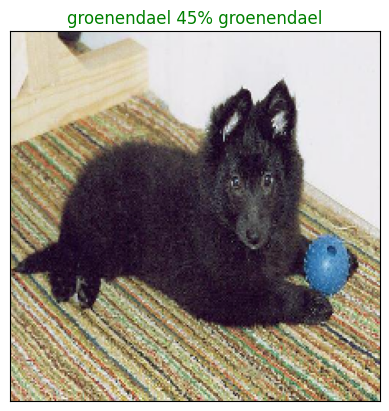

In [59]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our predictions, lets make another to view the model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array, ground truth array and an integer.
* Find the prediction using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes.
  * Prediction probabilities values.
  * Prediction labels.
* Plot the top 10 prediction probability values and labels, coloring the true label green.


In [60]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plot the top 10 highest prediction confidences along with
    the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Set up plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
      pass


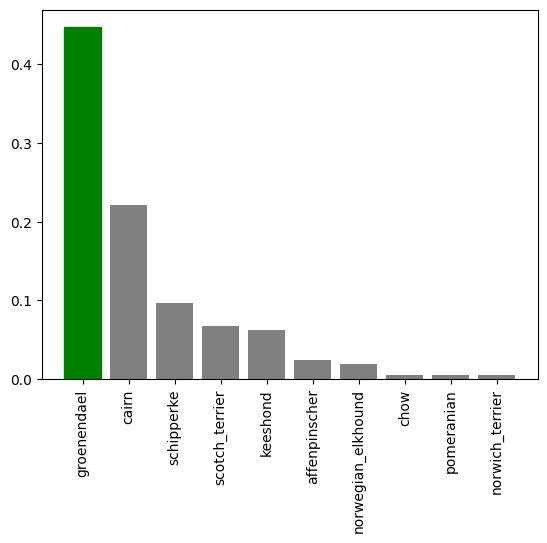

In [61]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=77)

Now we've got some functions to visualize our predictions and evaluate our model, lets check out a few.

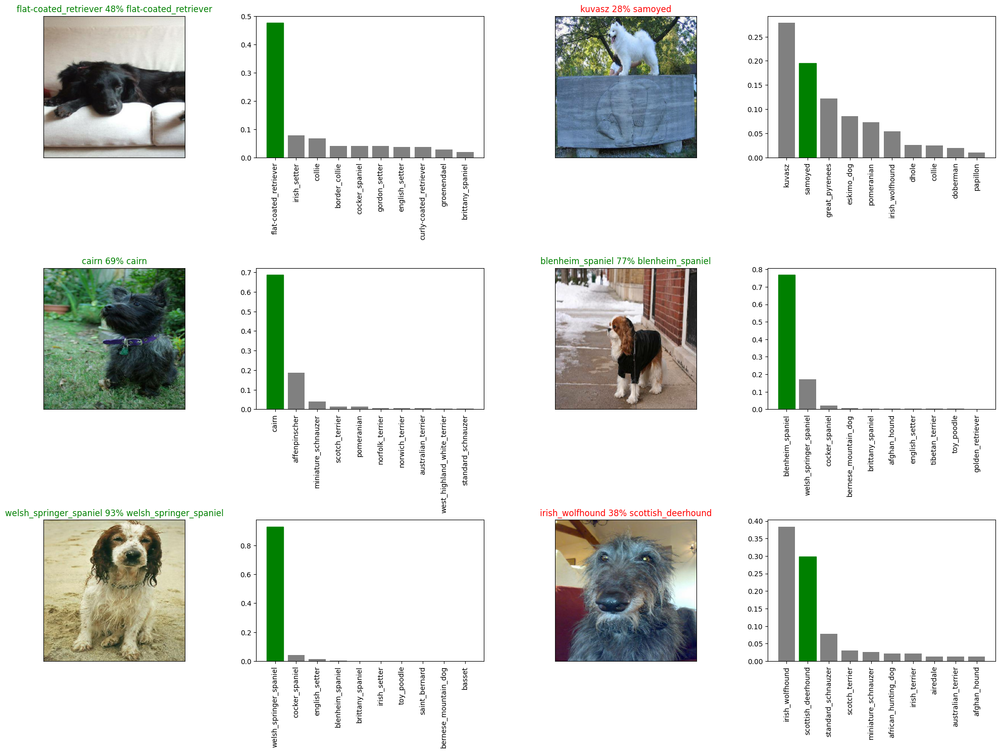

In [62]:
# Lets check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i + i_multiplier)
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i + i_multiplier)
    # i_multiplier += 25
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [63]:
# Create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (str)
    for clarity.
    """
    # Create model directory pathname with current time
    modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    model_path = modeldir + "-" + suffix + ".keras" # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [64]:
# Create a function to load a trained model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path,
                                      custom_objects={"KerasLayer":hub.KerasLayer},
                                      safe_mode=False)
    return model

Now we've got:
* A function to save a model.
* A function to load a saved model.

Let's make sure they work.

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20241121-15431732203806-1000-images-mobilenetv2-Adam.keras...


'drive/MyDrive/Dog Vision/models/20241121-15431732203806-1000-images-mobilenetv2-Adam.keras'

In [66]:
# Load our trained model
# loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20241120-12561732107404-1000-images-mobilenetv2-Adam.keras')

Loading saved model from: drive/MyDrive/Dog Vision/models/20241120-12561732107404-1000-images-mobilenetv2-Adam.keras


ValueError: File not found: filepath=drive/MyDrive/Dog Vision/models/20241120-12561732107404-1000-images-mobilenetv2-Adam.keras. Please ensure the file is an accessible `.keras` zip file.

In [67]:
# Evaluate pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.6631 - loss: 1.2202


[1.2733674049377441, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
# NOTE: THIS ERRORS OUT.
# loaded_1000_image_model.evaluate(val_data)

## Training the model on the full data

In [68]:
len(X), len(y)

(10222, 10222)

In [69]:
# Create a data batch with the full data
full_data = create_data_batches(X, y)

Creating training data batches...


In [70]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [71]:
# Create model for full data
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [72]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below might take a little while, because the GPU in use has to load all the images into memory.

In [73]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])


Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 56s 152ms/step - accuracy: 0.4836 - loss: 2.3865
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 46s 144ms/step - accuracy: 0.8862 - loss: 0.3900
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 137ms/step - accuracy: 0.9354 - loss: 0.2377
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 46s 142ms/step - accuracy: 0.9716 - loss: 0.1387
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 142ms/step - accuracy: 0.9823 - loss: 0.1021
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 145ms/step - accuracy: 0.9886 - loss: 0.0745
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 143ms/step - accuracy: 0.9939 - loss: 0.0532
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 44s 139ms/step - accuracy: 0.9949 - loss: 0.0450
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 137ms/step - accuracy: 0.9970 - loss: 0.0376
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 136ms/step - accuracy: 0.9981 - loss: 0.0280
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 139ms/step - accuracy: 0.9980 - loss: 0.0241
Epoch 12

In [74]:
save_model(full_model, suffix="full-data-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20241121-16081732205325-full-data-mobilenetv2-Adam.keras...


'drive/MyDrive/Dog Vision/models/20241121-16081732205325-full-data-mobilenetv2-Adam.keras'

In [75]:
len(X)

10222

## Making predictions on the test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesnt have labels).
* Make a prediction array by passing the test batches to the `predict` method on our model.


In [76]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 'drive/MyDrive/Dog Vision/test/ddfb44a70822741297344d0a9ea81f2d.jpg',
 'drive/MyDrive/Dog Vision/test/e4897fe96990006c10ec7336772cbd37.jpg',
 'drive/MyDrive/Dog Vision/test/e5657f523cf994628f63b673c88e9112.jpg',
 'drive/MyDrive/Dog Vision/test/e37be38e73463da5a0d9f3e33263d287.jpg',
 'drive/MyDrive/Dog Vision/test/dd8d95720349f85d2a795adaafc71172.jpg',
 'drive/MyDrive/Dog Vision/test/e425ab04e3a0d4464cda46a076964770.jpg',
 'drive/MyDrive/Dog Vision/test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 'drive/MyDrive/Dog Vision/test/dce52d7235885d9ad2ae34006e2ecb1e.jpg',
 'drive/MyDrive/Dog Vision/test/e411a1b3681604f6321af7cb8e8f2de7.jpg']

In [77]:
len(test_filenames)

10357

In [78]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [79]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run.

In [80]:
# Make predictions on test data batch using full_model
test_predictions = full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 247s 742ms/step


In [81]:
# Save Predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

In [82]:
# Load Predictions (Numpy array) from csv file
# NOTE: THIS ERRORS OUT.
# test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv", delimiter=",")

## Preparing test data set predictions for kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID column and a different column for each Dog breed.

To get the data in this format, we'll:
* Create a pandas Dataframe with an ID column and a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the data as a csv and submit to kaggle.

In [83]:
# Create a pandas Dataframe
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [84]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddf2401701ee374c0f1f9dd607071ec7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ddfb44a70822741297344d0a9ea81f2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e4897fe96990006c10ec7336772cbd37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5657f523cf994628f63b673c88e9112,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e37be38e73463da5a0d9f3e33263d287,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddf2401701ee374c0f1f9dd607071ec7,1.136388e-07,2.938431e-07,1.971000e-09,1.161935e-09,9.216507e-10,2.051949e-07,1.230586e-10,2.694750e-10,3.685422e-11,...,1.323470e-07,1.661845e-09,1.114228e-09,4.461728e-10,1.059418e-09,1.306694e-11,1.082944e-08,3.995095e-08,6.191939e-08,1.066651e-04
1,ddfb44a70822741297344d0a9ea81f2d,7.966279e-12,1.811706e-03,2.991788e-10,4.336195e-14,9.851363e-09,8.607903e-08,1.391559e-11,9.112103e-08,1.157637e-05,...,1.913345e-11,1.539331e-08,5.775273e-11,4.506499e-07,3.768610e-10,5.626845e-10,1.203616e-03,3.945505e-08,3.262058e-06,1.033569e-15
2,e4897fe96990006c10ec7336772cbd37,1.985129e-11,5.832699e-09,1.660893e-09,1.082844e-16,1.509817e-12,8.136668e-13,2.125656e-09,3.574328e-10,4.604165e-12,...,8.495478e-14,4.567297e-09,1.835237e-11,3.547547e-10,4.397769e-12,1.812614e-15,1.861160e-08,9.327558e-06,4.945002e-10,3.329023e-06
3,e5657f523cf994628f63b673c88e9112,1.102308e-07,6.000212e-07,2.531108e-08,1.189830e-08,9.808804e-09,2.156036e-07,4.575736e-10,5.526175e-10,1.444971e-08,...,1.122048e-08,3.328342e-11,3.902311e-10,4.941995e-10,1.460988e-09,2.003021e-10,5.089485e-10,4.642754e-09,2.230743e-09,9.357702e-12
4,e37be38e73463da5a0d9f3e33263d287,2.456355e-08,2.843251e-10,1.710278e-08,9.562822e-10,7.739114e-10,3.488696e-11,1.391572e-02,3.392113e-09,2.116134e-11,...,5.695102e-10,1.440221e-02,3.395518e-09,7.096052e-11,3.262889e-10,3.263837e-09,3.889841e-07,4.208349e-10,1.784584e-04,9.690807e-01


In [86]:
# Save the predictions dataframe to csv for submission to Kaggle.
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_mobilenetV2.csv", index=False)

# Making Predictions on custom images

To make predictions on custom images we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images wont have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method to make predictions.
* Convert the prediction output probabilities to prediction labels.
* Compare the prediction labels to the custom images.

In [87]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my_dog_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [88]:
custom_image_paths

['drive/MyDrive/Dog Vision/my_dog_images/american_eskimo.jpg',
 'drive/MyDrive/Dog Vision/my_dog_images/chihuahua.jpeg',
 'drive/MyDrive/Dog Vision/my_dog_images/pitbull.jpg']

In [89]:
# Turn custom images into batch data set
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [90]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [92]:
custom_preds.shape

(3, 120)

In [93]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['samoyed', 'chihuahua', 'staffordshire_bullterrier']

In [94]:
# Get custom images (our unbatchify()) wont work since there arent labels.
custom_images = []
# Loop through unbatch data
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

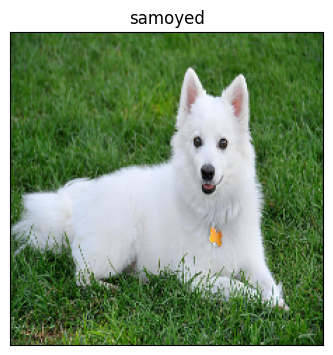

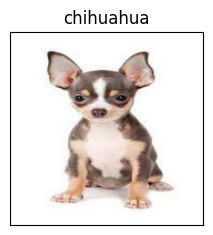

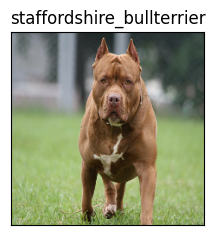

In [95]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)
    plt.tight_layout()
    plt.show()
